# 1. Подгрузка модулей и создание датасета

In [118]:
# %pip install tensorflow-cpu
# %pip install numpy
# %pip install pandas
# %pip install matplotlib
# %pip install seaborn
# %pip install scikit-learn
# %pip install tensorflow
# %pip install keras

In [61]:
import numpy as np
from random import randint
import matplotlib.pyplot as plt
import random
from sklearn.utils import shuffle
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
import itertools
import glob
import os
import shutil

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, load_model, model_from_json
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint

In [2]:
train_labels = []
train_samples = []

##### Погружение в keras начнем с работы с dummy data.

* Допустим, провели клиническое испытание какого-то нового препарата на людях возрастом от 13 до 100 лет
* В испытании участвовали 2100 человек. Половина из них была моложе 65 лет, остальная - 65 и старше
* Около 95% пожилых пациентов испытали побочные действия
* Около 95% пациентов из более молодой группы не ощутили побочных действий препарата

In [121]:
# генерируем исключения для каждой группы 
for i in range(50):
    random_younger = randint(13, 64)
    train_samples.append(random_younger)
    train_labels.append(1)
    
    random_older = randint(65, 100)
    train_samples.append(random_older)
    train_labels.append(0)
    
# генерируем 95 % данных
for i in range(1000):
    random_younger = randint(13, 64)
    train_samples.append(random_younger)
    train_labels.append(0)
    
    random_older = randint(65, 100)
    train_samples.append(random_older)
    train_labels.append(1)

In [122]:
train_labels = np.array(train_labels)
train_samples = np.array(train_samples)
train_labels, train_samples = shuffle(train_labels, train_samples)

In [123]:
scaler = MinMaxScaler()
scaled_train_samples = scaler.fit_transform(train_samples.reshape(-1, 1))

In [124]:
scaled_train_samples

array([[0.03448276],
       [0.32183908],
       [0.82758621],
       ...,
       [0.75862069],
       [0.1954023 ],
       [0.87356322]])

# 2. Tensorflow. Старт!

Сначала настроим Tensorflow...

In [125]:
# Проверяем, видит ли библиотека CPU
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [ ]:
# Проверим кол-во доступных GPU (их не будет, т.к. у меня Intel, но код для првоерки запустим)
physical_devices = tf.config.experimental.list_physical_devices("GPU")
print("Num of GPUs available: ", len(physical_devices))

Num of GPUs available:  0


In [126]:
# Ставим точность поменьше - для оптимизации
tf.keras.mixed_precision.set_global_policy('mixed_float16')

In [127]:
model = Sequential([
    Dense(units=16, input_shape=(1,), activation="relu"),
    Dense(units=32, activation="relu"),
    Dense(units=2, activation="softmax")
])

/home/user/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [128]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_13 (Dense)                │ (None, 16)             │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 642 (2.51 KB)

 Trainable params: 642 (2.51 KB)

 Non-trainable params: 0 (0.00 B)

### Подготавливаем модель к обучению

In [129]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss="sparse_categorical_crossentropy", metrics=['accuracy'])

In [130]:
model.fit(x=scaled_train_samples, y=train_labels, batch_size=10, epochs=30, shuffle=True, verbose=2)

Epoch 1/30
210/210 - 1s - 6ms/step - accuracy: 0.5429 - loss: 0.6687
Epoch 2/30
210/210 - 0s - 2ms/step - accuracy: 0.6486 - loss: 0.6430
Epoch 3/30
210/210 - 0s - 2ms/step - accuracy: 0.7238 - loss: 0.6113
Epoch 4/30
210/210 - 0s - 2ms/step - accuracy: 0.7600 - loss: 0.5806
Epoch 5/30
210/210 - 0s - 2ms/step - accuracy: 0.8062 - loss: 0.5505
Epoch 6/30
210/210 - 0s - 2ms/step - accuracy: 0.8210 - loss: 0.5197
Epoch 7/30
210/210 - 0s - 2ms/step - accuracy: 0.8400 - loss: 0.4887
Epoch 8/30
210/210 - 0s - 2ms/step - accuracy: 0.8614 - loss: 0.4585
Epoch 9/30
210/210 - 0s - 2ms/step - accuracy: 0.8824 - loss: 0.4296
Epoch 10/30
210/210 - 0s - 2ms/step - accuracy: 0.8857 - loss: 0.4032
Epoch 11/30
210/210 - 0s - 2ms/step - accuracy: 0.8971 - loss: 0.3796
Epoch 12/30
210/210 - 0s - 2ms/step - accuracy: 0.8995 - loss: 0.3598
Epoch 13/30
210/210 - 0s - 2ms/step - accuracy: 0.9081 - loss: 0.3428
Epoch 14/30
210/210 - 0s - 2ms/step - accuracy: 0.9133 - loss: 0.3289
Epoch 15/30
210/210 - 0s - 2m

### Пробуем с валидацией...

In [131]:
model.fit(
        x=scaled_train_samples, 
        y=train_labels, 
        validation_split=0.1,
        batch_size=10,
        epochs=30,
        shuffle=True,
        verbose=2        
)

Epoch 1/30
189/189 - 1s - 3ms/step - accuracy: 0.9333 - loss: 0.2670 - val_accuracy: 0.9619 - val_loss: 0.2211
Epoch 2/30
189/189 - 0s - 2ms/step - accuracy: 0.9344 - loss: 0.2662 - val_accuracy: 0.9619 - val_loss: 0.2204
Epoch 3/30
189/189 - 0s - 2ms/step - accuracy: 0.9360 - loss: 0.2654 - val_accuracy: 0.9619 - val_loss: 0.2196
Epoch 4/30
189/189 - 0s - 2ms/step - accuracy: 0.9333 - loss: 0.2646 - val_accuracy: 0.9619 - val_loss: 0.2189
Epoch 5/30
189/189 - 0s - 2ms/step - accuracy: 0.9360 - loss: 0.2640 - val_accuracy: 0.9619 - val_loss: 0.2184
Epoch 6/30
189/189 - 0s - 2ms/step - accuracy: 0.9339 - loss: 0.2634 - val_accuracy: 0.9619 - val_loss: 0.2177
Epoch 7/30
189/189 - 0s - 2ms/step - accuracy: 0.9333 - loss: 0.2627 - val_accuracy: 0.9619 - val_loss: 0.2171
Epoch 8/30
189/189 - 0s - 2ms/step - accuracy: 0.9354 - loss: 0.2621 - val_accuracy: 0.9619 - val_loss: 0.2165
Epoch 9/30
189/189 - 0s - 2ms/step - accuracy: 0.9339 - loss: 0.2616 - val_accuracy: 0.9619 - val_loss: 0.2160
E

### Тестовая выборка

Сгенерируем тестовую выборку c 420 записями

In [132]:
test_samples = []
test_labels = []

# генерируем исключения для каждой группы 
for i in range(10):
    random_younger = randint(13, 64)
    test_samples.append(random_younger)
    test_labels.append(1)
    
    random_older = randint(65, 100)
    test_samples.append(random_older)
    test_labels.append(0)
    
# генерируем 95 % данных
for i in range(200):
    random_younger = randint(13, 64)
    test_samples.append(random_younger)
    test_labels.append(0)
    
    random_older = randint(65, 100)
    test_samples.append(random_older)
    test_labels.append(1)
    
test_samples = np.array(test_samples)
test_labels = np.array(test_labels)
test_samples, test_labels = shuffle(test_samples, test_labels)

In [133]:
scaled_test_samples = scaler.fit_transform(test_samples.reshape(-1, 1))

In [134]:
predictions = model.predict(scaled_test_samples, batch_size=10, verbose=False)

In [135]:
for i in predictions:
    print(i)

[0.0713 0.928 ]
[0.9717  0.02855]
[0.2783 0.722 ]
[0.04962 0.9507 ]
[0.0884 0.9116]
[0.02733 0.9727 ]
[0.9717 0.0281]
[0.9717 0.028 ]
[0.1342 0.8657]
[0.1251 0.875 ]
[0.1514 0.849 ]
[0.9717  0.02834]
[0.9717 0.0281]
[0.9717 0.0281]
[0.9717  0.02827]
[0.1016 0.8984]
[0.9717  0.02834]
[0.9614 0.0386]
[0.2076 0.7925]
[0.9717 0.0285]
[0.0767 0.9233]
[0.0824 0.9175]
[0.7285 0.2717]
[0.03693 0.9634 ]
[0.04602 0.954  ]
[0.2076 0.7925]
[0.02943 0.9707 ]
[0.095 0.905]
[0.02733 0.9727 ]
[0.2783 0.722 ]
[0.7974 0.2025]
[0.504  0.4966]
[0.06635 0.9336 ]
[0.9717  0.02834]
[0.9062  0.09406]
[0.095 0.905]
[0.9717 0.028 ]
[0.7974 0.2025]
[0.0342 0.966 ]
[0.4546 0.5454]
[0.0767 0.9233]
[0.03964 0.9604 ]
[0.2076 0.7925]
[0.9717  0.02821]
[0.3193 0.6807]
[0.361 0.638]
[0.9717  0.02855]
[0.827  0.1731]
[0.5527 0.447 ]
[0.9526  0.04742]
[0.03964 0.9604 ]
[0.0427 0.957 ]
[0.11694 0.883  ]
[0.361 0.638]
[0.2783 0.722 ]
[0.1016 0.8984]
[0.2076 0.7925]
[0.9717  0.02834]
[0.928  0.0713]
[0.9707  0.02898]
[0.971

In [136]:
precise_pred = np.argmax(predictions, axis=1)
precise_pred 

array([1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,

### Confusion Matrix

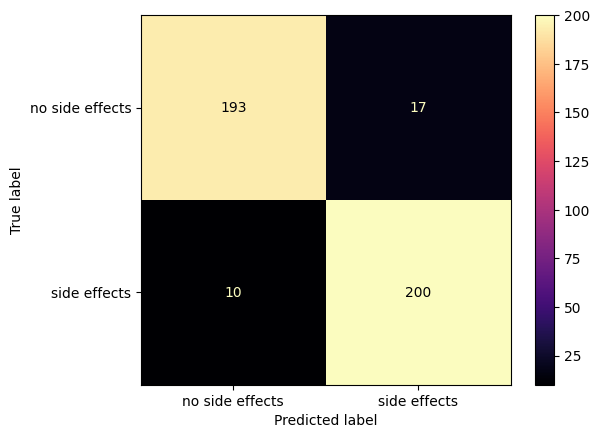

In [137]:
cm = metrics.confusion_matrix(y_true=test_labels, y_pred=precise_pred)
cm_plot = metrics.ConfusionMatrixDisplay(cm, display_labels=['no side effects', 'side effects'])
cm_plot.plot(cmap="magma")

# 3. Сохранение моделей

In [4]:
path = 'models/model_seq_med_trials.h5'

if os.path.isfile(path) is False:
    model.save(path)

Такой сейв сохраняет:
* Архитектуру модели, позволяя снова создать ее
* Веса модели
* Конфигурации (loss, optimizer)
* Состояние оптимизатора, позволяя вернуться к оптимизации там, где мы остановились

![](other/tensorflow.png)

In [5]:
new_model = load_model(path)
new_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 644 (2.52 KB)

 Trainable params: 642 (2.51 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

### model.to_json()

Если нужно сохранить только архитектуру модели, без весов и тренировочных конфигураций, используем model.to_json()

In [140]:
json_string = model.to_json()
json_string

'{"module": "keras", "class_name": "Sequential", "config": {"name": "sequential_5", "trainable": true, "dtype": {"module": "keras", "class_name": "DTypePolicy", "config": {"name": "mixed_float16"}, "registered_name": null}, "layers": [{"module": "keras.layers", "class_name": "InputLayer", "config": {"batch_shape": [null, 1], "dtype": "float32", "sparse": false, "ragged": false, "name": "input_layer_5"}, "registered_name": null}, {"module": "keras.layers", "class_name": "Dense", "config": {"name": "dense_13", "trainable": true, "dtype": {"module": "keras", "class_name": "DTypePolicy", "config": {"name": "mixed_float16"}, "registered_name": null}, "units": 16, "activation": "relu", "use_bias": true, "kernel_initializer": {"module": "keras.initializers", "class_name": "GlorotUniform", "config": {"seed": null}, "registered_name": null}, "bias_initializer": {"module": "keras.initializers", "class_name": "Zeros", "config": {}, "registered_name": null}, "kernel_regularizer": null, "bias_regul

In [141]:
model_architecture = model_from_json(json_string)
model_architecture.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_13 (Dense)                │ (None, 16)             │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,932 (7.56 KB)

 Trainable params: 642 (2.51 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,290 (5.05 KB)

In [142]:
path_weights = 'models/w.weights.h5'

if os.path.isfile(path_weights) is False:
    new_model.save_weights(path_weights)

In [143]:
model2 = Sequential([
    Dense(units=16, input_shape=(1, ), activation="relu"),
    Dense(units=32, activation="relu"),
    Dense(units=2, activation='softmax')
])

/home/user/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [144]:
model2.get_weights()

[array([[ 0.55988765, -0.24250627,  0.3329482 , -0.2064651 , -0.56368065,
          0.18171954,  0.48713064, -0.31336778, -0.2557597 , -0.19835255,
          0.5863962 ,  0.4231416 , -0.14562613,  0.1496275 ,  0.08244103,
         -0.33896273]], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       dtype=float32),
 array([[-0.10448043, -0.09211522,  0.2476699 , -0.21186513, -0.01026681,
         -0.09510502,  0.05717489, -0.04611388,  0.22839656, -0.21251385,
         -0.20854276,  0.05015019,  0.13688985, -0.27403712,  0.11427855,
          0.29194883, -0.10474318,  0.3031957 ,  0.07790837,  0.09395155,
         -0.0763427 , -0.05483845,  0.3152677 , -0.20141633, -0.11987574,
         -0.17199884,  0.05364189,  0.22413132,  0.3424975 ,  0.2817007 ,
          0.22142038, -0.14733678],
        [-0.14701824, -0.2405104 , -0.2753    ,  0.3346435 ,  0.16908178,
          0.18695137, -0.15429792,  0.00961319,  0.16341397,  0.26394525,
          0.06

In [145]:
model2.load_weights('models/w.weights.h5')

# 4. CNN model

## Подготовка данных...

Поработаем со скачанным датасетом: разделим его на тренировочную и валидационную выборки. 

In [71]:
os.getcwd()

'/home/user/keras'

In [72]:
dir_path = '/home/user/keras/data'

# переходим в директорию со всеми тренировочными файлами
os.chdir(dir_path)

'''
Если используется весь датасет, то стоит выполнить следующий код

# считаем кол-во данных
dir_len = 0
for path in os.listdir(dir_path):
    if os.path.isfile(os.path.join(dir_path, path)):
        dir_len += 1
# какой процент тренировочных данных уйдет в валидацию
alpha = 0.3
valid_size = round(dir_len*alpha)
# какой процент от оставшихся данных уйдет в тест
beta = 0.012
test_size = round(dir_len*beta)
'''
# задаем размер тренировочной выборки
N = 500
# какой процент тренировочных данных уйдет в валидацию
alpha = 0.2
valid_size = round(N * alpha)
# какой процент от оставшихся данных уйдет в тест
beta = 0.1
test_size = round(N * beta)

if os.path.isdir('train/dog') is False:
    # создаем папки с данными
    os.makedirs('train/dog')
    os.makedirs('train/cat')
    os.makedirs('valid/dog')
    os.makedirs('valid/cat')
    os.makedirs('test/dog')
    os.makedirs('test/cat')
    
    # выбираем и перемещаем тренировочные образцы
    for c in random.sample(glob.glob('cat*'), N):
        shutil.move(c, 'train/cat')
    for d in random.sample(glob.glob('dog*'), N):
        shutil.move(d, 'train/dog')
    # выбираем и перемещаем валидационные образцы
    for c in random.sample(glob.glob('cat*'), valid_size):
        shutil.move(c,'valid/cat')
    for d in random.sample(glob.glob('dog*'), valid_size):
        shutil.move(d, 'valid/dog')
    # выбираем и перемещаем тестовые образцы
    for c in random.sample(glob.glob('cat*'), test_size):
        shutil.move(c,'test/cat')
    for d in random.sample(glob.glob('dog*'), test_size):
        shutil.move(d, 'test/dog')
    
    # удаляем оставшиеся файлы
    for file in os.listdir(dir_path):
        file_path = os.path.join(dir_path, file)
        if not os.path.isdir(file_path):
            os.remove(file_path)
            
os.chdir('../')


In [73]:
train_path = 'data/train'
valid_path = 'data/valid'
test_path = 'data/test'

In [74]:
train_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)\
    .flow_from_directory(directory=train_path, target_size=(224, 224), classes=['cat', 'dog'], batch_size=10)
valid_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)\
    .flow_from_directory(directory=valid_path, target_size=(224, 224), classes=['cat', 'dog'], batch_size=10)
test_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)\
    .flow_from_directory(directory=test_path, target_size=(224, 224), classes=['cat', 'dog'], batch_size=10, shuffle=False)

Found 1000 images belonging to 2 classes.
Found 200 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


***\*Примечание: target_size - параметр, масштабирующих картинки до заданного размера.***

### Проверяем, правильно ли мы все сделали

In [75]:
imgs, labels = next(train_batches)

In [36]:
# функция для показа картинок
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 10, figsize=(20, 20))
    axes = axes.flatten()
    
    for image, ax in zip(images_arr, axes):
        ax.imshow(image)
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()  

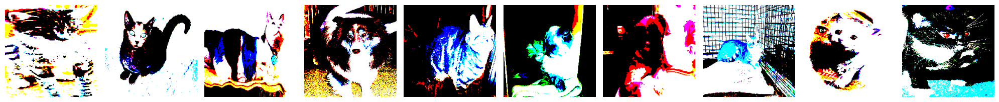

[[1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]]


In [77]:
plotImages(imgs)
print(labels)

## Построение модели

In [78]:
model = Sequential([
    Conv2D(filters=32, kernel_size=(3,3), activation="relu", padding="same", input_shape=(224, 224, 3)),
    MaxPool2D(pool_size=(2,2), strides=2),
    Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding='same'),
    MaxPool2D(pool_size=(2,2), strides=2),
    Flatten(),
    Dense(units=2, activation="softmax")
])

In [79]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │       401,410 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 420,802 (1.61 MB)

 Trainable params: 420,802 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

In [80]:
model.compile(optimizer=Adam(learning_rate=1e-4), loss="categorical_crossentropy", metrics=['accuracy'])

In [81]:
model.fit(x=train_batches, validation_data=valid_batches, epochs=10, verbose=2)

Epoch 1/10
100/100 - 10s - 100ms/step - accuracy: 0.5610 - loss: 23.3304 - val_accuracy: 0.5850 - val_loss: 4.8478
Epoch 2/10
100/100 - 8s - 76ms/step - accuracy: 0.7520 - loss: 1.8622 - val_accuracy: 0.5500 - val_loss: 5.8623
Epoch 3/10
100/100 - 9s - 87ms/step - accuracy: 0.8860 - loss: 0.5774 - val_accuracy: 0.6250 - val_loss: 2.7932
Epoch 4/10
100/100 - 9s - 88ms/step - accuracy: 0.9470 - loss: 0.2246 - val_accuracy: 0.6600 - val_loss: 3.0302
Epoch 5/10
100/100 - 9s - 90ms/step - accuracy: 0.9790 - loss: 0.0641 - val_accuracy: 0.6500 - val_loss: 2.4265
Epoch 6/10
100/100 - 8s - 78ms/step - accuracy: 0.9970 - loss: 0.0126 - val_accuracy: 0.6500 - val_loss: 2.4633
Epoch 7/10
100/100 - 9s - 90ms/step - accuracy: 1.0000 - loss: 0.0022 - val_accuracy: 0.6500 - val_loss: 2.4095
Epoch 8/10
100/100 - 9s - 91ms/step - accuracy: 1.0000 - loss: 6.9150e-04 - val_accuracy: 0.6500 - val_loss: 2.4359
Epoch 9/10
100/100 - 9s - 93ms/step - accuracy: 1.0000 - loss: 5.4693e-04 - val_accuracy: 0.6400 

Видим явное переобучение начиная с 3 цикла. Но все же - учитывая, что это первая модель - попробуем сделать предсказания на тесте и оценить.

## Predict

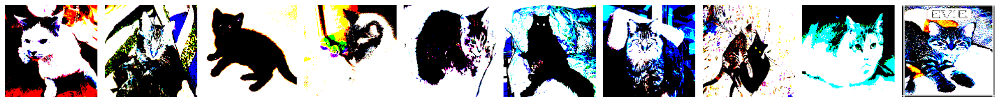

[[1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]]


In [82]:
test_imgs, test_labels = next(test_batches)
plotImages(test_imgs)
print(test_labels)

In [83]:
test_batches.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [84]:
predictions = model.predict(test_batches, verbose=0)

/home/user/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


In [85]:
np.round(predictions)

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.

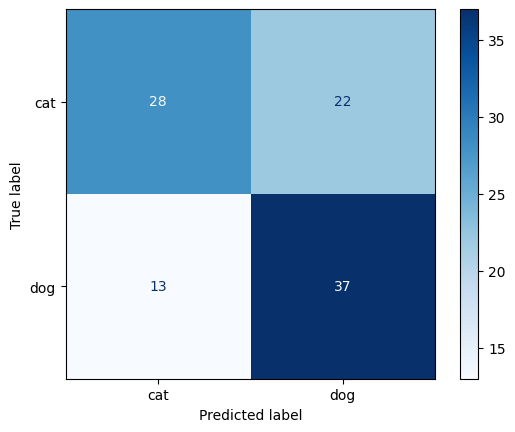

In [86]:
cm = metrics.confusion_matrix(y_true=test_batches.classes, y_pred=np.argmax(predictions, axis=1))

cm_plot = metrics.ConfusionMatrixDisplay(cm, display_labels=['cat', 'dog'])
cm_plot.plot(cmap="Blues")

# 5. Переходим к тяжелой артилерии - VGG16

Для начала скачаем VGG16 - модель для классификации картинок.

In [87]:
vgg16_model = tf.keras.applications.vgg16.VGG16()

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 57s 0us/step


In [88]:
vgg16_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

In [89]:
type(vgg16_model)

keras.src.models.functional.Functional

Как видим, VGG16 имеет вывод в 1000 классов в конце, а нам нужно всего два. Исправим это:

In [ ]:
model = Sequential()
# создаем новую модель, перемещая в нее все слои, кроме последнего
for layer in vgg16_model.layers[:-1]:
    model.add(layer)

In [95]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,260,544 (512.16 MB)

 Trainable params: 134,260,544 (512.16 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# замораживаем веса параметров
for layer in model.layers:
    layer.trainable = False

In [96]:
model.add(Dense(units=2, activation='softmax'))

In [97]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 2)              │         8,194 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,268,738 (512.19 MB)

 Trainable params: 134,268,738 (512.19 MB)

 Non-trainable params: 0 (0.00 B)

Исправили! Стоит отметить, что мы заморозили остальные параметры, т.к. VGG16 изначально и училась определять кошек и собак. Поэтому все, что нам нужно было - это поменять выход на два класса. 

## Тренируем fine-tuned VGG16

In [99]:
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

In [100]:
model.fit(x=train_batches, validation_data=valid_batches, epochs=5, verbose=2)

Epoch 1/5
100/100 - 344s - 3s/step - accuracy: 0.5420 - loss: 0.9073 - val_accuracy: 0.5000 - val_loss: 0.6964
Epoch 2/5
100/100 - 331s - 3s/step - accuracy: 0.5680 - loss: 0.6926 - val_accuracy: 0.6400 - val_loss: 0.6064
Epoch 3/5
100/100 - 333s - 3s/step - accuracy: 0.7400 - loss: 0.5546 - val_accuracy: 0.7900 - val_loss: 0.4777
Epoch 4/5
100/100 - 331s - 3s/step - accuracy: 0.8340 - loss: 0.4071 - val_accuracy: 0.7950 - val_loss: 0.4341
Epoch 5/5
100/100 - 346s - 3s/step - accuracy: 0.8760 - loss: 0.3017 - val_accuracy: 0.8650 - val_loss: 0.2981


## Predictions

In [102]:
predictions = model.predict(x=test_batches, verbose=0)

In [103]:
test_batches.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [104]:
test_batches.class_indices

{'cat': 0, 'dog': 1}

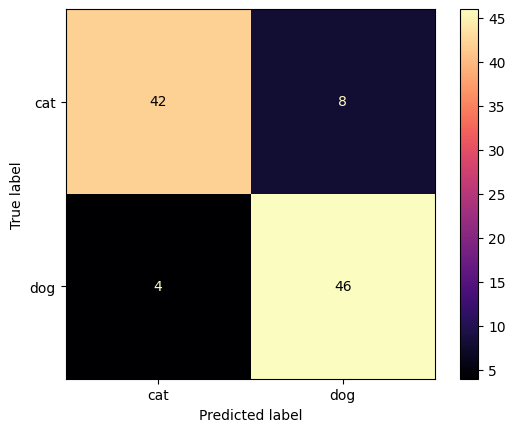

In [105]:
cm_16 = metrics.confusion_matrix(y_true=test_batches.classes, y_pred=np.argmax(predictions, axis=1))
cm_16_plot = metrics.ConfusionMatrixDisplay(cm_16, display_labels=['cat', 'dog'])
cm_16_plot.plot(cmap='magma')

# 6. MobileNet

Модель с говорящим названием: она предназначена для смартфонов, более легкая (17 Мб) и имеет почти в 60 раз меньше параметров. Конечно, трейдофф в данном случае связан с точностью модели, но по сравнению с выгодой, которую мы получаем - данная модель оптимальнее.

## Тестим...

In [5]:
# Загружаем MobileNet
mobile = tf.keras.applications.mobilenet.MobileNet()

In [6]:
def prepare_image(file):
    img_path = 'data/MobileNet/'
    img = image.load_img(img_path + file, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array_expanded_dims = np.expand_dims(img_array, axis=0)
    return tf.keras.applications.mobilenet.preprocess_input(img_array_expanded_dims)

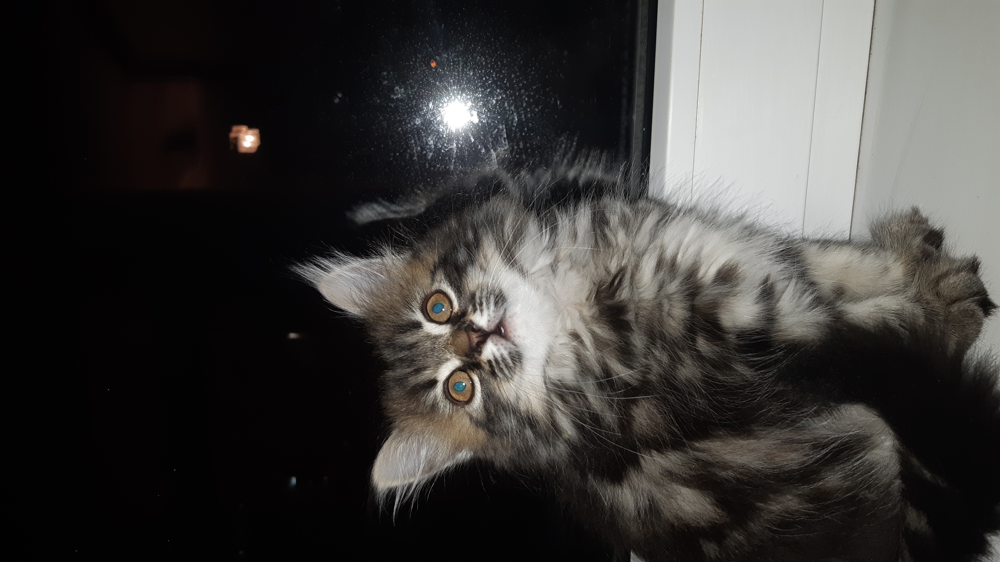

In [7]:
from IPython.display import Image
Image(filename='data/MobileNet/busya.jpg', width=300, height=200)

In [8]:
preprocessed_image = prepare_image('busya.jpg')
predictions_mob = mobile.predict(preprocessed_image)
# results = imagenet_utils.decode_predictions(predictions_mob)
# results
predictions_mob

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


array([[2.85561725e-07, 2.33057449e-06, 1.31123954e-06, 5.28342889e-06,
        1.42713006e-07, 3.77410333e-06, 1.37595725e-06, 2.00686081e-05,
        8.78198116e-05, 2.43404684e-05, 1.99779856e-06, 1.41897158e-06,
        1.27964331e-05, 6.43892861e-07, 1.70077200e-07, 8.55547114e-06,
        1.54939289e-06, 1.44719979e-06, 3.67995113e-07, 5.34740366e-07,
        5.27488339e-07, 1.51719069e-04, 2.74657236e-06, 5.44837327e-04,
        3.66831664e-04, 2.68325181e-07, 7.96330824e-07, 2.12721673e-07,
        4.43114970e-07, 5.48973773e-08, 8.55421831e-07, 1.73918963e-07,
        2.12821369e-08, 6.44827537e-07, 1.91290255e-07, 1.78193147e-07,
        1.06000050e-06, 1.86671997e-07, 4.06524748e-07, 1.94957011e-06,
        1.06864615e-08, 1.77039283e-07, 2.48247289e-07, 2.15147466e-07,
        2.65039773e-07, 3.90150632e-07, 2.28382916e-07, 2.78244059e-08,
        6.49938556e-08, 1.58501138e-07, 9.05914419e-07, 6.69114570e-06,
        4.29480700e-08, 7.45419371e-09, 1.05540057e-08, 1.272288

In [9]:
results = imagenet_utils.decode_predictions(predictions_mob)
results

[[('n02123045', 'tabby', np.float32(0.43227154)),
  ('n02123394', 'Persian_cat', np.float32(0.18208954)),
  ('n02123159', 'tiger_cat', np.float32(0.1030718)),
  ('n02112350', 'keeshond', np.float32(0.10242401)),
  ('n02124075', 'Egyptian_cat', np.float32(0.054256782))]]

Попробуем что-нибудь вкусненькое...

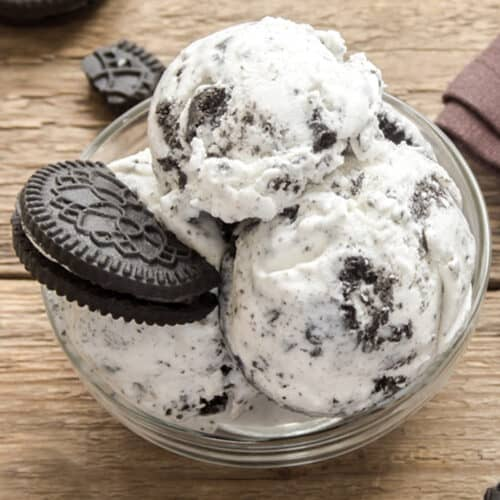

In [10]:
Image(filename='data/MobileNet/2.jpg')

In [11]:
prepr_image = prepare_image('2.jpg')
pred = mobile.predict(prepr_image)

result = imagenet_utils.decode_predictions(pred)
result

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


[[('n07614500', 'ice_cream', np.float32(0.9738096)),
  ('n07613480', 'trifle', np.float32(0.023560317)),
  ('n07684084', 'French_loaf', np.float32(0.00055504276)),
  ('n07836838', 'chocolate_sauce', np.float32(0.00027979285)),
  ('n07871810', 'meat_loaf', np.float32(0.00024678427))]]

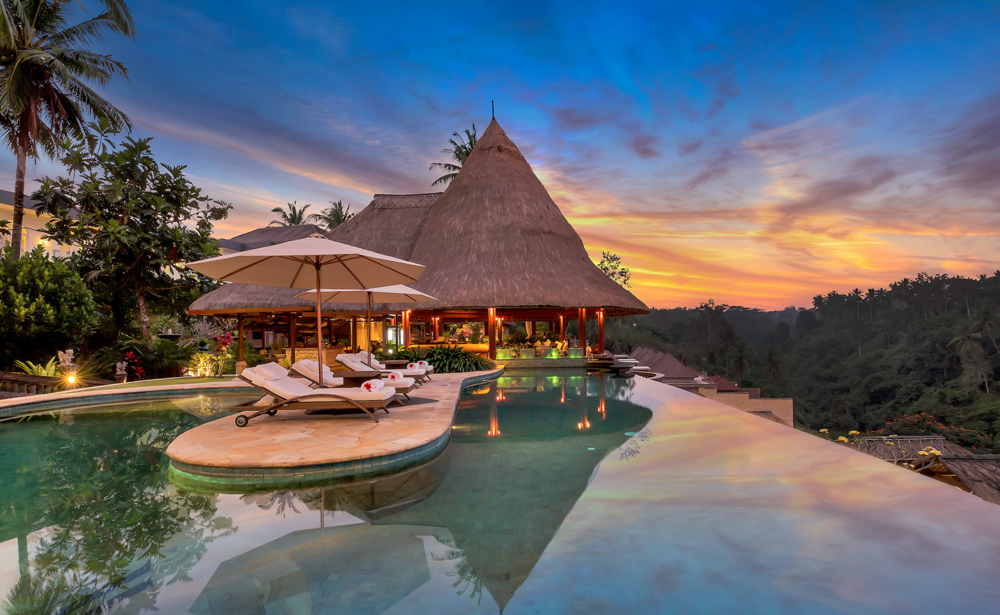

In [12]:
Image(filename='data/MobileNet/bali.png', height=200, width=300)

In [13]:
prep_image = prepare_image('bali.png')
pred = mobile.predict(prep_image)
results = imagenet_utils.decode_predictions(pred)
results

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


[[('n09421951', 'sandbar', np.float32(0.18291691)),
  ('n02859443', 'boathouse', np.float32(0.14901619)),
  ('n03028079', 'church', np.float32(0.112400636)),
  ('n09332890', 'lakeside', np.float32(0.09618767)),
  ('n04483307', 'trimaran', np.float32(0.05218339))]]

Как видим, тут нейронка не так уверенно и точно угадывает, что есть на изображении.

## Начинаем работу с реальным датасетом

Научим нашу модель распознавать жесты, обозначающие цифры. <p>
Ссылка на датасет: https://github.com/ardamavi/Sign-Language-Digits-Dataset

In [14]:
# %git clone git@github.com:ardamavi/Sign-Language-Digits-Dataset.git

В папке есть еще примеры, лицензия и readme - оставим только наши папки с цифрами 

In [15]:
os.chdir('data/Sign-Language-Digits-Dataset')

if not os.path.isdir('train/0/'):
    os.mkdir('train')
    os.mkdir('valid')
    os.mkdir('test')
    # пробагаемся по всем папкам с изображениями цифр
    for i in range(0, 10):
        shutil.move(f'{i}', 'train')
        os.mkdir(f'valid/{i}')
        os.mkdir(f'test/{i}')
        
        valid_samples = random.sample(os.listdir(f'train/{i}'), 30)
        
        for j in valid_samples:
            shutil.move(f'train/{i}/{j}', f'valid/{i}')
            
        test_samples = random.sample(os.listdir(f'train/{i}'), 5)
        
        for k in test_samples:
            shutil.move(f'train/{i}/{k}', f'test/{i}')
os.chdir('../../')

In [16]:
train_path = 'data/Sign-Language-Digits-Dataset/train'
valid_path = 'data/Sign-Language-Digits-Dataset/valid'
test_path = 'data/Sign-Language-Digits-Dataset/test'
pic_size = (224, 224)

In [17]:
train_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input)\
    .flow_from_directory(directory=train_path, target_size = pic_size, batch_size = 10)
valid_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input)\
    .flow_from_directory(directory=valid_path, target_size = pic_size, batch_size = 10)
test_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input)\
    .flow_from_directory(directory=test_path, target_size = pic_size, batch_size=10, shuffle=False)

Found 1712 images belonging to 10 classes.
Found 300 images belonging to 10 classes.
Found 50 images belonging to 10 classes.


## Fine-tuning

In [18]:
# Напомним, как выглядит наша модель
mobile.summary()

Model: "mobilenet_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 4,253,864 (16.23 MB)

 Trainable params: 4,231,976 (16.14 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [19]:
X = mobile.layers[-6].output
X = tf.keras.layers.GlobalAveragePooling2D()(X)
output_layer = Dense(units=10, activation="softmax")(X)

In [20]:
model = Model(inputs=mobile.input, outputs=output_layer)

In [21]:
# заморозим веса первых 23 слоев
for layer in model.layers[:-23]:
    layer.trainable = False

In [22]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 3,239,114 (12.36 MB)

 Trainable params: 1,873,930 (7.15 MB)

 Non-trainable params: 1,365,184 (5.21 MB)

## Компилим и тренируем модель - уже как обычно ;)

In [23]:
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

In [24]:
model.fit(x=train_batches, validation_data=valid_batches, epochs=8, verbose=2)

Epoch 1/8


/home/user/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


172/172 - 29s - 169ms/step - accuracy: 0.8230 - loss: 0.6289 - val_accuracy: 0.8500 - val_loss: 0.4041
Epoch 2/8
172/172 - 28s - 162ms/step - accuracy: 0.9813 - loss: 0.1135 - val_accuracy: 0.9533 - val_loss: 0.1666
Epoch 3/8
172/172 - 27s - 155ms/step - accuracy: 0.9912 - loss: 0.0664 - val_accuracy: 0.9633 - val_loss: 0.1427
Epoch 4/8
172/172 - 26s - 151ms/step - accuracy: 0.9988 - loss: 0.0314 - val_accuracy: 0.9667 - val_loss: 0.1060
Epoch 5/8
172/172 - 26s - 152ms/step - accuracy: 0.9971 - loss: 0.0287 - val_accuracy: 0.9667 - val_loss: 0.1173
Epoch 6/8
172/172 - 26s - 148ms/step - accuracy: 0.9977 - loss: 0.0178 - val_accuracy: 0.9667 - val_loss: 0.1019
Epoch 7/8
172/172 - 27s - 155ms/step - accuracy: 0.9994 - loss: 0.0129 - val_accuracy: 0.9933 - val_loss: 0.0747
Epoch 8/8
172/172 - 26s - 154ms/step - accuracy: 0.9994 - loss: 0.0138 - val_accuracy: 0.9700 - val_loss: 0.1093


## Predict

In [25]:
test_labels = test_batches.classes
test_labels

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 8, 8, 8, 8,
       8, 9, 9, 9, 9, 9], dtype=int32)

In [26]:
prediction = model.predict(x=test_batches)
prediction

/home/user/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step


array([[9.99890327e-01, 2.36333199e-05, 1.62805809e-05, 5.13507439e-05,
        7.09721803e-07, 2.50094308e-06, 4.93037192e-07, 3.46100751e-06,
        3.38096561e-06, 7.88854322e-06],
       [9.99997616e-01, 5.39472012e-07, 2.05092917e-07, 8.15795090e-07,
        1.33042235e-07, 8.66740457e-09, 2.53321900e-07, 1.00865243e-07,
        7.80123841e-08, 2.50655148e-07],
       [9.99985456e-01, 8.91323816e-06, 4.17890760e-07, 8.90591878e-07,
        1.99618981e-07, 1.44158008e-07, 3.55207158e-06, 2.54682924e-08,
        3.05919770e-07, 9.54504316e-08],
       [9.99985695e-01, 4.72227975e-06, 1.84245806e-07, 4.01426661e-07,
        4.43083735e-07, 2.52736214e-08, 7.86859346e-06, 1.80881354e-08,
        2.83746971e-07, 2.64511016e-07],
       [9.99998569e-01, 1.00812599e-06, 1.33968037e-08, 5.31224025e-08,
        1.76784543e-08, 2.07892192e-09, 2.26462227e-08, 2.02375077e-08,
        1.32821842e-08, 3.54932979e-07],
       [1.16430027e-04, 9.99087572e-01, 6.30712428e-04, 4.63179276e-05,
   

In [27]:
test_batches.class_indices.values()

dict_values([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

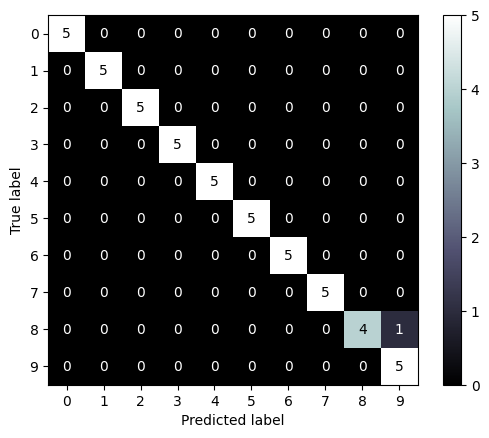

In [28]:
cm = metrics.confusion_matrix(test_labels, np.argmax(prediction, axis=1))
cm_plot = metrics.ConfusionMatrixDisplay(cm, display_labels=test_batches.class_indices.values())
cm_plot.plot(cmap='bone')

Как видим, модель супер точная - лишь один раз из 45 она сделала неправильная предсказание.

# 7. Аугментация данных

Это процесс создания новых данных из уже имеющихся. Например, мы создаем сайт, где автоматически проверяются домашки учеников. Но вот проблема: ученики могут случайно загружать перевернутые фотографии. Тогда это становится проблемой для нашего алгоритма, т.к. у нас не было перевернутых данных. 

In [29]:
# создаем генератор данных с различными параматрами: поворотом, масштабированием и т.д.
gen = ImageDataGenerator(rotation_range=10, width_shift_range=0.1,
                         height_shift_range=0.1, shear_range=0.15, zoom_range=0.1,
                         channel_shift_range=10, horizontal_flip=True)

In [30]:
os.getcwd()

'/home/user/keras'

In [31]:
chosen_image = random.choice(os.listdir('data/train/cat/'))
image_path = 'data/train/cat/' + chosen_image

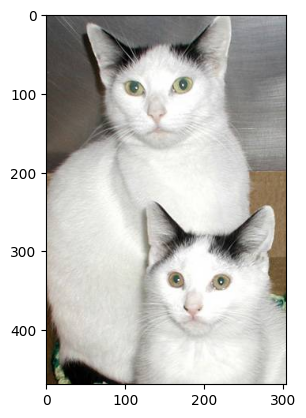

In [32]:
image = np.expand_dims(plt.imread(image_path), 0)
plt.imshow(image[0])

In [33]:
aug_iter = gen.flow(image)

In [34]:
aug_images = [next(aug_iter)[0].astype(np.uint8) for i in range(10)]

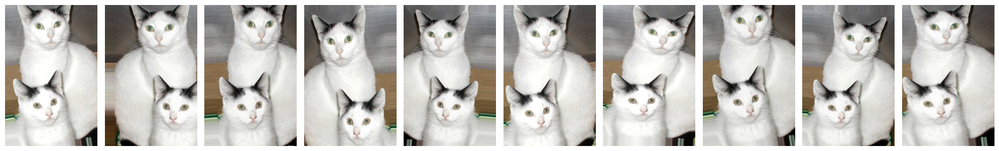

In [37]:
plotImages(aug_images)

In [ ]:
def save_aug_images(aug_images, file_name, output_dir = 'data/aug'):
    os.makedirs(output_dir, exist_ok=True)
    # имя для сохранения - без формата
    name_for_save = "".join(file_name.split('.')[:-1])
    
    for i, image in enumerate(aug_images):
        plt.imshow(image)
        plt.axis('off')
        plt.savefig(f'{output_dir}/{name_for_save}_{i}.jpg', bbox_inches='tight', pad_inches=0)
        plt.close()

save_aug_images(aug_images, chosen_image)

In [39]:
chosen_image

'cat.3378.jpg'

### Пришла идея: под конец проверить качество лучшей модели при аугментировании

In [90]:
# функция для создания аугментированных данных
def create_data_augmentation(dir_path='data/aug', N=10, m=5):
    generator = ImageDataGenerator(rotation_range=40, width_shift_range=0.15,
                                   height_shift_range=0.15, zoom_range=0.3,
                                   channel_shift_range=10, horizontal_flip=True)
    
    image_samples = random.sample(os.listdir(dir_path), N)
    
    for image_path in image_samples:
        path = dir_path + '/' + image_path
        image = np.expand_dims(plt.imread(path), 0)
        aug_iter = generator.flow(image)
        aug_images = [next(aug_iter)[0].astype(np.uint8) for _ in range(m)]
        save_aug_images(aug_images, file_name=image_path, output_dir=dir_path)

In [92]:
create_data_augmentation(dir_path='data/train/cat', N=200, m=3)
create_data_augmentation(dir_path='data/train/dog', N=200, m=3)

In [95]:
train_path = 'data/train/'
valid_path = 'data/valid/'
test_path = 'data/test/'
pic_size = (224, 224)

In [96]:
train_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input)\
    .flow_from_directory(directory=train_path, target_size=pic_size, batch_size=10)
valid_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input)\
    .flow_from_directory(directory=valid_path, target_size=pic_size, batch_size=10)
test_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input)\
    .flow_from_directory(directory=test_path, target_size=pic_size, batch_size=10, shuffle=False)

Found 2200 images belonging to 2 classes.
Found 200 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [97]:
mobile = tf.keras.applications.mobilenet.MobileNet()
X = mobile.layers[-6].output
X = tf.keras.layers.GlobalAveragePooling2D()(X)
output_layer = Dense(units=2, activation='softmax')(X)

best_model = Model(inputs = mobile.input, outputs = output_layer)

for layer in best_model.layers[:-23]:
    layer.trainable = False


In [98]:
best_model.compile(optimizer=Adam(learning_rate=1e-4, epsilon=1e-5, beta_1=0.85, beta_2=0.98), loss='categorical_crossentropy', metrics=['accuracy'])

In [99]:
# для сохранения лучшей модели с лучшими весами
checkpoint = ModelCheckpoint(
    'best_model_cat_dog.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)
# обучаем модель
best_model.fit(x=train_batches, validation_data=valid_batches, epochs=10, verbose=2, callbacks=[checkpoint])

/home/user/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


220/220 - 36s - 163ms/step - accuracy: 0.9273 - loss: 0.1694 - val_accuracy: 0.9600 - val_loss: 0.0793
Epoch 2/10
220/220 - 29s - 132ms/step - accuracy: 0.9818 - loss: 0.0476 - val_accuracy: 0.9050 - val_loss: 0.2068
Epoch 3/10
220/220 - 30s - 137ms/step - accuracy: 0.9791 - loss: 0.0573 - val_accuracy: 0.9250 - val_loss: 0.1977
Epoch 4/10
220/220 - 30s - 135ms/step - accuracy: 0.9923 - loss: 0.0260 - val_accuracy: 0.9500 - val_loss: 0.1212
Epoch 5/10
220/220 - 31s - 140ms/step - accuracy: 0.9850 - loss: 0.0449 - val_accuracy: 0.9450 - val_loss: 0.1680
Epoch 6/10
220/220 - 34s - 157ms/step - accuracy: 0.9918 - loss: 0.0208 - val_accuracy: 0.9450 - val_loss: 0.1619
Epoch 7/10
220/220 - 31s - 141ms/step - accuracy: 0.9955 - loss: 0.0122 - val_accuracy: 0.9500 - val_loss: 0.1069
Epoch 8/10


220/220 - 32s - 143ms/step - accuracy: 0.9914 - loss: 0.0168 - val_accuracy: 0.9650 - val_loss: 0.1156
Epoch 9/10


220/220 - 32s - 145ms/step - accuracy: 0.9950 - loss: 0.0122 - val_accuracy: 0.9700 - val_loss: 0.0884
Epoch 10/10
220/220 - 29s - 132ms/step - accuracy: 0.9968 - loss: 0.0091 - val_accuracy: 0.9200 - val_loss: 0.3103


Скачиваем лучшую модель:

In [113]:
best_model = load_model('best_model_cat_dog.h5')

In [114]:
y_pred_best = best_model.predict(test_batches, verbose=0)
y_pred_best_arr = np.argmax(y_pred_best, axis=1)

In [115]:
y_pred_best_arr

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [116]:
labels = ['cat', 'dog']
test_batches.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

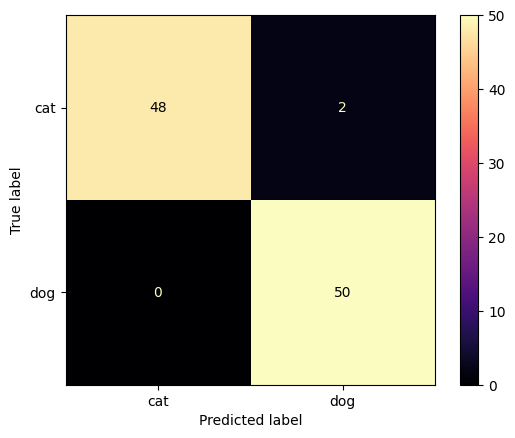

In [117]:
# так часто использовал Confusion Matrix, можно было б сразу написать функцию...
def plot_cm(y_true, y_pred, labels, cmap='magma'):
    cm = metrics.confusion_matrix(y_true, y_pred)
    cm_plot = metrics.ConfusionMatrixDisplay(cm, display_labels=labels)
    cm_plot.plot(cmap=cmap)

plot_cm(test_batches.classes, y_pred_best_arr, labels)

In [121]:
def incorrect_predictions(y_true, y_pred):
    false_pred_list = []
    for i, pred in enumerate(y_true):
        if pred != y_pred[i]:
            false_pred_list.append(i)
    return false_pred_list

false_pred_list = incorrect_predictions(test_batches.classes, y_pred_best_arr)
false_pred_list

[34, 43]

In [126]:
os.listdir('data/test/cat')[43]

'cat.10890.jpg'

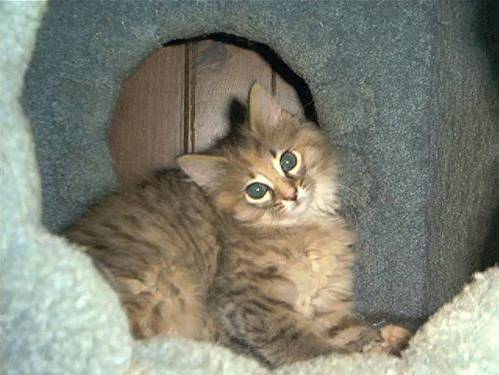

In [129]:
Image('data/test/cat/'+os.listdir('data/test/cat')[34])

Ну тут да, не кот - а, скорее, тигрь)

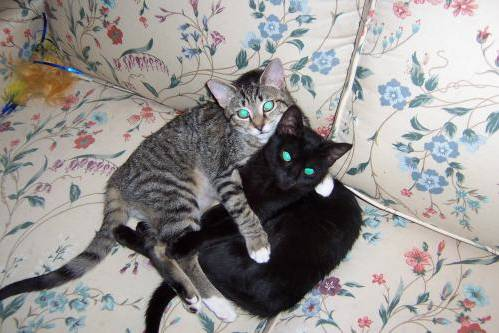

In [130]:
Image('data/test/cat/'+os.listdir('data/test/cat')[43])

Ну и видим фантастику: на тестовом датасете accuracy 98%. Отличный результат!)

# 8. Вывод

Итак, пришло время подводить итоги:

Познакомился со структурой библиотеки tensorflow,
Поработал с реогранизацией и подгтовкой данных,
Обучил пару моделей с нуля,
Зафайнтюнил популярные решения под свои задачи,
Провел оценку качества моделей

ИИ классно делает предсказания, и на самом деле лёгок для использования, когда знаешь теорию. 